In [1]:
import os

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

### Load and inspect raw images

Let's display random image samples for each of the 5 classes of diabetic retinopathy.

In [2]:
# Paths to the data directory
DIR_TRAIN = '../data/raw/aptos2019/train_images'
# Read the training set metadata
train_df = pd.read_csv('../data/raw/aptos2019/train.csv')

In [3]:
def load_image(path: str) -> np.ndarray:
    """
    Reads an image from disk and converts its color space for proper display.

    Args:
        path (str): Full path to the image file.
    Returns:
        numpy.ndarray: Image array in RGB format.
    """
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [4]:
def plot_sample_grid(transform_fn):
    """Displays a 5x7 grid of sample images with the given transform applied."""
    fig, axes = plt.subplots(5, 7, figsize=(25, 15))
    for cat in range(0, 5):
        filtered_df = train_df[train_df['diagnosis'] == cat]
        np.random.seed(42)
        random_ids = np.random.choice(filtered_df['id_code'].values, size=7, replace=False)
        for i, image_id in enumerate(random_ids):
            ax = axes[cat, i]
            ax.axis('off')
            image_path = os.path.join(DIR_TRAIN, f'{image_id}.png')
            image = transform_fn(image_path)
            ax.imshow(image)
            ax.set_title(f'{cat}-{image_id}')

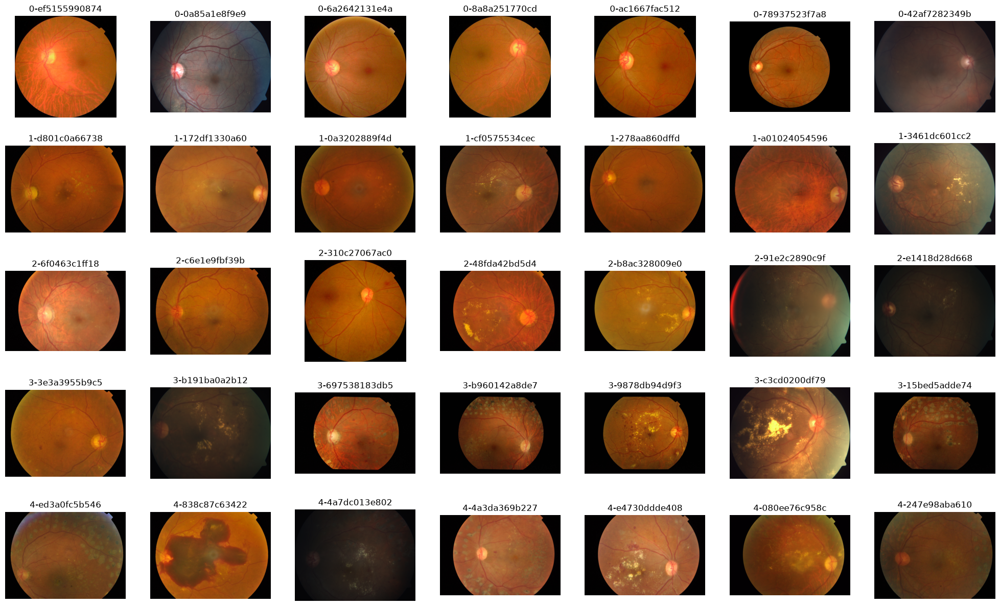

In [5]:
plot_sample_grid(lambda x: load_image(x))

### Crop black borders

Some images have unwanted black edges, let's crop them and display the result.

In [6]:
def crop_black_borders(img: np.ndarray, tol: int = 10) -> np.ndarray:
    """
    Crops black borders around an image.

    Args:
        img (np.ndarray): Image array in RGB format.
        tol (int, optional): Tolerance threshold for black pixels. Defaults to 10.

    Returns:
        np.ndarray: Cropped image.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    mask = gray > tol
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    ymin, ymax = np.where(rows)[0][[0, -1]]
    xmin, xmax = np.where(cols)[0][[0, -1]]
    return img[ymin:ymax + 1, xmin:xmax + 1]

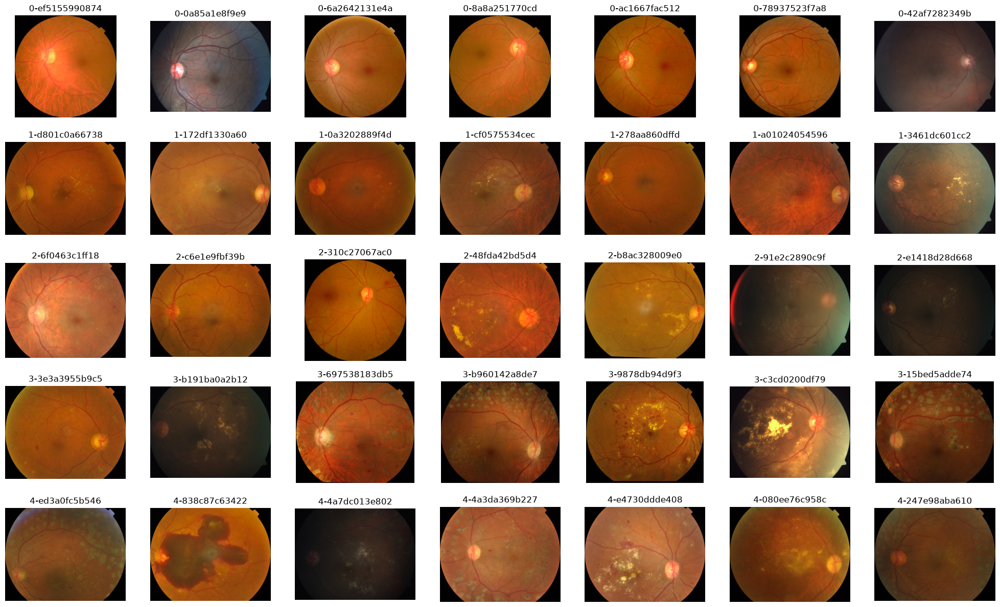

In [7]:
plot_sample_grid(lambda x: crop_black_borders(load_image(x)))

### Resize (aspect-ratio-preserving vs stretch) and Ben Graham color preprocessing

Since the images have different shapes, they need to be resized. We implement two ways of resizing: preserving the aspect ratio (using padding) and stretching (without preserving proportions) and test how they perform in combination with Ben Graham's color processing method.

Ben Graham's image preprocessing method is an approach for normalizing retinal (fundus) images that enhances the visibility of blood vessels and small lesions while eliminating lighting variations. It was proposed by Ben Graham, the winner of the Kaggle Diabetic Retinopathy Detection competition. To read more about it: https://medium.com/@astronomer.abdurrehman/enhancing-image-quality-for-machine-learning-ben-grahams-preprocessing-e795ad982abe

In [8]:
def resize_with_padding(img: np.ndarray, target_size: tuple[int],
                        pad_color: tuple[int] = (0, 0, 0)) -> np.ndarray:
    """
    Resizes image to target size and pads it saving aspect ratio.

    Args:
        img (np.ndarray): Image array in RGB format.
        target_size (int): Target size in pixels.
        pad_color (tuple[int], optional): Padding color. Defaults to (0, 0, 0).

    Returns:
        np.ndarray: Resized image.
    """
    height, width = img.shape[:2]
    target_width, target_height = target_size
    scale = min(target_width / width, target_height / height)
    new_width = int(width * scale)
    new_height = int(height * scale)
    resized_img = cv2.resize(img, (new_width, new_height))

    pad_top = (target_height - new_height) // 2
    pad_bottom = target_height - pad_top - new_height
    pad_left = (target_width - new_width) // 2
    pad_right = target_width - pad_left - new_width

    padded_img = cv2.copyMakeBorder(
        resized_img,
        pad_top, pad_bottom, pad_left, pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=pad_color
    )
    return padded_img


def resize(img: np.ndarray, target_size: int, method: str) -> np.ndarray:
    """
    Resizes an image to the target size, either preserving the aspect ratio or stretching.

    Args:
        image (np.ndarray): Image array in RGB format.
        target_size (int): Target size in pixels.
        method (str): Resize method ('stretch' or 'preserve_aspect_ratio').
    Returns:
        np.ndarray: Resized image.
    """
    if method == 'preserve_aspect_ratio':
        img = resize_with_padding(img, target_size=(target_size, target_size))
    if method == 'stretch':
        img = cv2.resize(img, (target_size, target_size))
    return img

In [9]:
def ben_preprocess(img: np.ndarray, target_size: int) -> np.ndarray:
    """
    Applies Ben's preprocessing technique.

    Args:
        image (np.ndarray): Image array in RGB format.
        target_size (int): Target size in pixels.
    Returns:
        np.ndarray: Preprocessed image.
    """
    return cv2.addWeighted(
        img, 4,
        cv2.GaussianBlur(img, (0, 0), target_size / 30.0), -4, 128
    )

Let's apply Ben's preprocessing technique with different resizing technics.

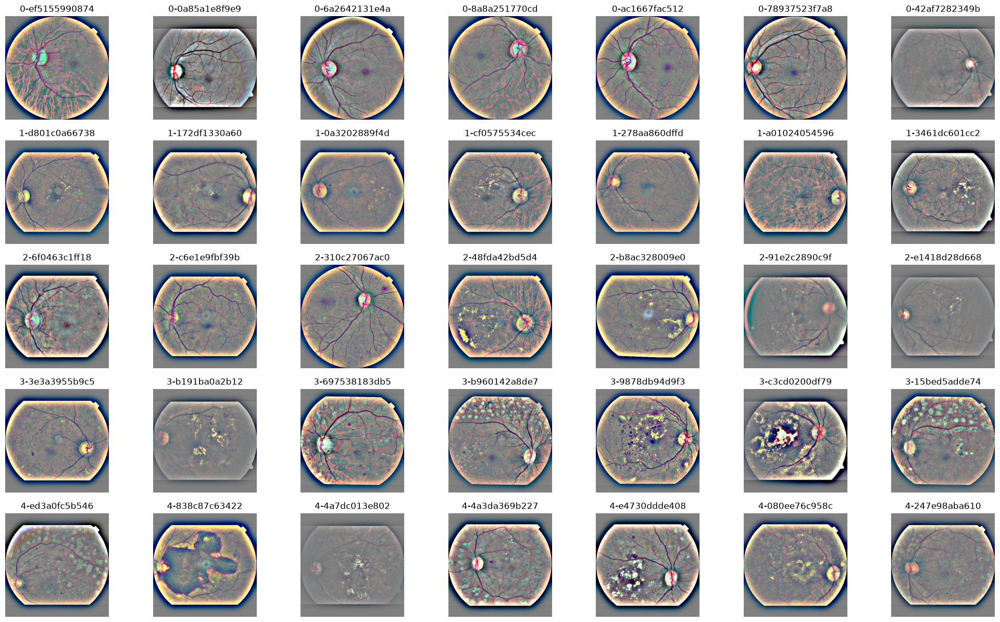

In [10]:
def preprocess_pipeline(img_path: str, target_size: int = 384) -> np.ndarray:
    img = load_image(img_path)
    img = crop_black_borders(img)
    img = resize(img, target_size=target_size, method="preserve_aspect_ratio")
    img = ben_preprocess(img, target_size=target_size)
    return img

plot_sample_grid(preprocess_pipeline)

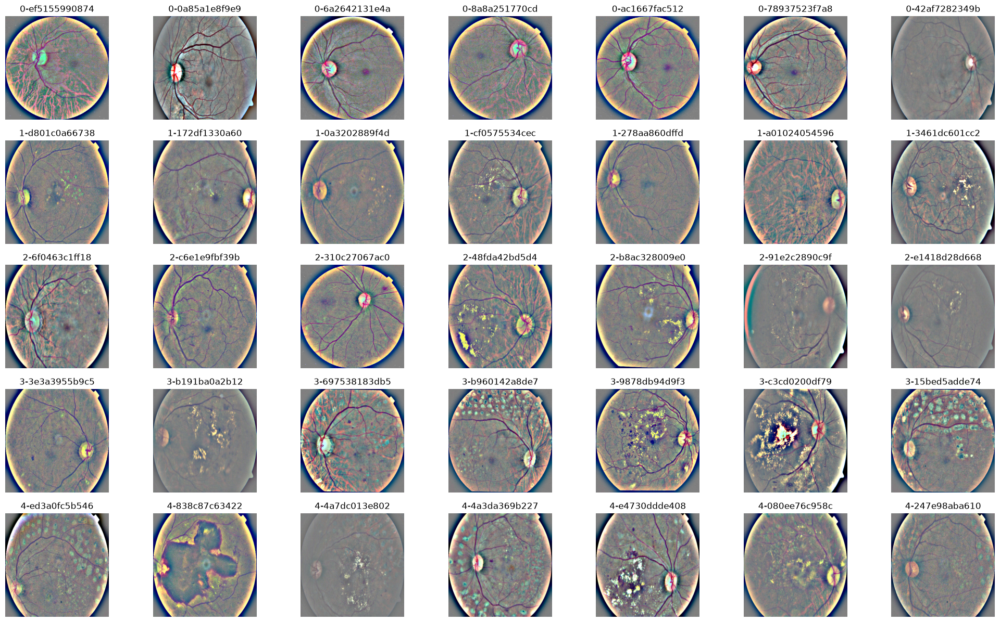

In [11]:
def preprocess_pipeline(img_path: str, target_size: int = 384) -> np.ndarray:
    img = load_image(img_path)
    img = crop_black_borders(img)
    img = resize(img, target_size=target_size, method="stretch")
    img = ben_preprocess(img, target_size=target_size)
    return img
    
plot_sample_grid(preprocess_pipeline)

Ben Graham's method noticeably improves the visibility of fine retinal
structures (such as blood vessels and small lesions). It also partially acts as a color normalization technique, reducing the warm/cool tone difference identified during EDA.

However, applying this technique introduces a boundary artifact (bright/discolored halo between the retina and the black background).

### Boundary artifact removal

To eliminate this artifact we apply circular mask, that clips the outer 10% of the radius and fills the surrounding background with a neutral gray value (128).

Resizing with aspect ratio preservation is not suitable here as a fixed-radius mask leaves padding edges/halo visible outside the mask at the top and bottom. Direct resizing (stretching) was
chosen as the final approach, despite the minor aspect-ratio distortion it
introduces for non-square source images.

In [12]:
def remove_border(img: np.ndarray, target_size: int) -> np.ndarray:
    """
    Removes the boundary artifact of an image by applying a circular mask.

    Args:
        img (np.ndarray): Image array in RGB format.
        target_size (int): Target size in pixels.
    Returns:
        np.ndarray: Image with border removed.
    """
    # Circle mask (90% of radius)
    mask = np.zeros((target_size, target_size), dtype=np.uint8)
    center = (target_size // 2, target_size // 2)
    radius = int((target_size / 2) * 0.9)
    cv2.circle(mask, center, radius, 255, thickness=-1)
    img[mask == 0] = 128
    return img

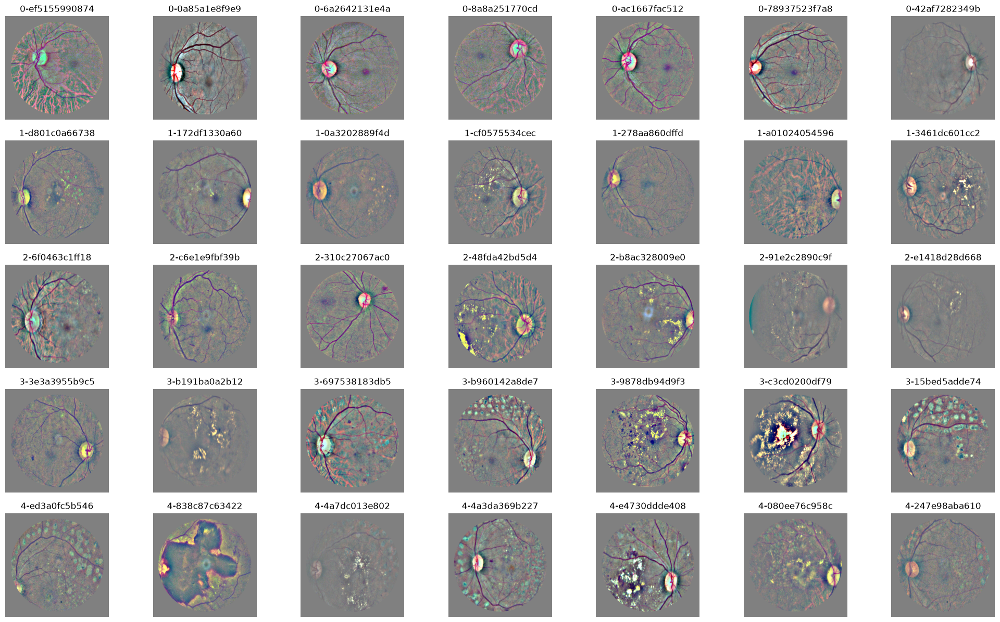

In [13]:
def preprocess_pipeline(img_path: str, target_size: int = 384) -> np.ndarray:
    img = load_image(img_path)
    img = crop_black_borders(img)
    img = resize(img, target_size=target_size, method="stretch")
    img = ben_preprocess(img, target_size=target_size)
    img = remove_border(img, target_size=target_size)
    return img
    
plot_sample_grid(preprocess_pipeline)

### Summary:

1. **Final pipeline:** crop black borders -> direct resize (stretching) -> Ben's preprocessing technique -> boundary artifact removal.
2. Chose stretch resize over preserving aspect ratio to ensure clean circular boundary masking. **Possible future improvement:** adaptive per-image radius detection instead of fixed geometry (would allow to combine preserving aspect ratio with clean boundary removal)